# Examining Different Outflows
In this notebook, we will take a closer look at the different outflows identified within this project within the NGC 3324 region of the Carina Nebula.
The program `outflow_lookup.py` is intended to query an .xlsx file with the different identified sources (e.g. PJ001, PJ002 etc.), and produce a cropped image of the protostellar outflow. 

In [1]:
# use the entire screen width for the notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
# make interactive plots
%matplotlib notebook

In [12]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset, BboxPatch, TransformedBbox, \
BboxConnector
import pandas as pd
import glob # for filepath handling
import sys
#
import warnings
warnings.filterwarnings('ignore')
#
# Astropy:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import LinearStretch, LogStretch, ZScaleInterval, \
    MinMaxInterval, simple_norm, make_lupton_rgb
import reproject as rpj # needed for reproject module

sys.path.append('../code')
from reproject_combine import reproject, make_rgb
from continuum_sub import ContinuumSubtract
import outflow_lookup as ol

First we will get the coordinates of a desired outflow. In this notebook as an example, we will use PJ001. The largest outflow observed in the data.

In [4]:
path_to_file = '/mnt/c/Users/pjjan/OneDrive - Maynooth University/DIAS/outflow_sources_NGC3324.xlsx' # Set file path of the excel file
dict_ = ol.get_dictionary(path_to_file)
focus = 'PJ001' # set the source name
coords = ol.get_coordinates(path_to_file, focus)

We now have the coordinates of the outflow **PJ001**. We now want to select an image or a group of images to 'crop' so just the outflow is observed. For now, we will use all the NIRCam images.

In [5]:
# Get image file names
img_dir = '/mnt/d/st_images/Carina_level3/'
files = glob.glob(img_dir + '*nircam*')
print('Files found:')
for f in files:
    print(f)

Files found:
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f090w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f187n_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f200w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f335m_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f444w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_f444w-f470n_i2d.fits


We will create a mosaic to show all outflows on the continuum subtracted image, so then we can easily choose an outflow to focus on.

In [6]:
c = ContinuumSubtract(files[5], files[4])
reproj_c = c.reproject_continuum() # reproject/resize files
scale_factor = 0.9756262810503796 # got previously from continuum sub notebook
full_subc = c.continuum_sub(reproj_c, scale_factor)

In [7]:
n_header = c.get_data_headers(get_data=False)[1]
c_wcs = WCS(n_header)

<IPython.core.display.Javascript object>


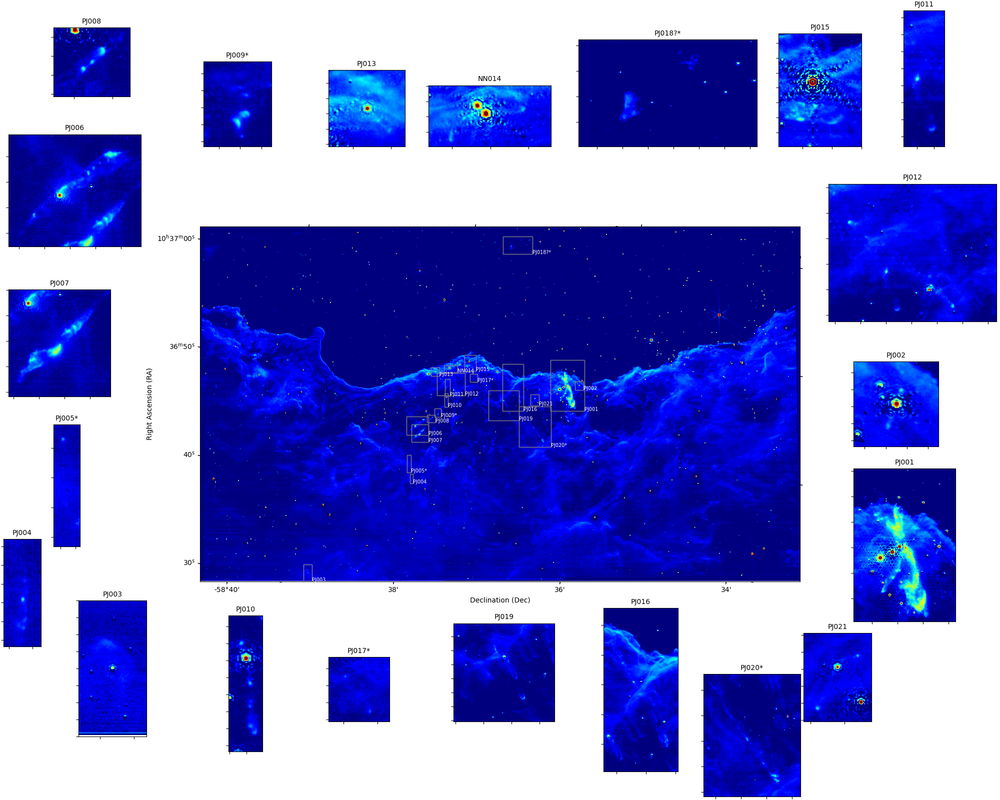

In [41]:
fig = plt.figure(figsize=(20,16))
norm = simple_norm(full_subc, stretch='log', invalid=0, min_cut=0, max_cut=900)
ax = plt.subplot(1, 1, 1, projection=c_wcs)
plt.subplots_adjust(left=0.2, right=0.8)
ax.imshow(full_subc, origin='lower', norm = norm, cmap='jet')
ax.coords['ra'].set_ticklabel_position('l')
ax.coords['dec'].set_ticklabel_position('b')
ax.set_ylabel('Right Ascension (RA)', fontsize=10)
ax.set_xlabel('Declination (Dec)', fontsize=10)

# Setup zoomed inset axis for each source
# Set locations of each image
anchor_locs = [(1700, 350), (1700, 700), (150, 120), (0, 300), (100, 500), \
               (10, 1100), (10, 800), (100, 1400), (400, 1300), \
               (450, 90), (1800, 1300), (1650, 950), (650, 1300), (850, 1300),
               (1550, 1300), (1200, 50), (650, 150), (1150, 1300), (900, 150), (1400, 0), (1600, 150)]

# Set up pixel region constraints for each source
p_pm = [(200, 200, 300, 300), (50, 50, 50, 50), (50, 50, 100, 100), (20, 20, 50, 65), (25, 20, 95, 110), \
        (100, 160, 100, 120), (100, 100, 100, 110), (50, 50, 45, 45), (40, 40, 30, 70), (20, 20, 110, 50), \
       (20, 40, 100, 100), (200, 130, 70, 200), (50, 50, 50, 50), (70, 90, 50, 30), (60, 80, 110, 80), \
       (100, 150, 300, 250), (60, 30, 15, 80), (100, 250, 80, 130), (180, 180, 230, 120), (280, 100, 80, 400), (50, 50, 80, 50)]

# Zoom levels for each outflow
zoom = [3, 10, 8, 11, 7, \
       6, 6, 9, 10, 10, \
       8, 6, 9, 9, 7, \
       3.5, 8, 6, 3.3, 3, 8]

for i in range(len(dict_['Name'])):
    axins = zoomed_inset_axes(ax, zoom[i], loc=3, bbox_to_anchor=(anchor_locs[i]))
    axins.imshow(full_subc, origin='lower', norm=norm, cmap='jet')
    coords = ol.get_coordinates(path_to_file, dict_['Name'][i])
    pixel_x, pixel_y = c_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
    pixel_x, pixel_y = int(pixel_x), int(pixel_y)
    region = eval(ol.pixel_region(pixel_x, pixel_y, custom_bounds=p_pm[i]))
    axins.set_xlim(region[1].start, region[1].stop)
    axins.set_ylim(region[0].start, region[0].stop)
    axins.set_title(f"{dict_['Name'][i]}", fontsize=10)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    rect = TransformedBbox(axins.viewLim, ax.transData)
    pp = BboxPatch(rect, fc='none', ec='0.5', label=f"{dict_['Name'][i]}")
    ax.add_patch(pp)
    x, y = BboxConnector.get_bbox_edge_pos(rect, 4)
    ax.annotate(f"{dict_['Name'][i]}", xy=(x,y), xytext=(x, y), xycoords='figure pixels', \
               color='w', fontsize=7)
    # If you want lines connecting Bboxes, run below
#     if i > 18 or i == 15 or i == 0:
#         mark_inset(ax, axins, loc1=2, loc2=2, fc="none", ec="0.5")[0]
#     else:
#         mark_inset(ax, axins, loc1=4, loc2=4, fc="none", ec="0.5")[0]
    
plt.tight_layout(rect=(0.09,0,0,0))
plt.show()
# plt.savefig('NGC3324_outflows_1.png', bbox_inches='tight')

We will use the ***F444W-F470N*** image as we did before for continuum subtraction as our target image. This image will be used to calculate its WCS information and for reprojection/resizing of other images onto it. 

In [6]:
target = files[5]
with fits.open(target) as hdu:
    tar_header = hdu['SCI'].header
    tar_data = hdu['SCI'].data

target_wcs = WCS(tar_header) # get target WCS info
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y) # set them to integers for cropping

Now setting up the pixel region to focus on around the focus point.

In [7]:
y_pm = 300 # Setup y plus-minus
x_pm = 300 # Seyup x plus-minus
region = ol.pixel_region(pixel_x, pixel_y, x_pm, y_pm) # Define region

Reproject desired images onto the target world coordinate system (WCS) and then crop them to the region defined above.

In [8]:
reproj = reproject(files, target_wcs, tar_data) # Reprojection
cropped_imgs = ol.crop_images(reproj, region) # cropping

It is now desirable to make an RGB image of the 'PJ001' outflow. We will make use of `reproject_combine.py`'s `make_rgb` function to do so, passing the cropped images to it.

In [9]:
custom_stack = [0, 2, 3, 3, 4, 5] # setting up custom stacking order for make_rgb()
rgb = make_rgb(cropped_imgs, stretch=37, Q=0, minimum=0, custom_stack=custom_stack)

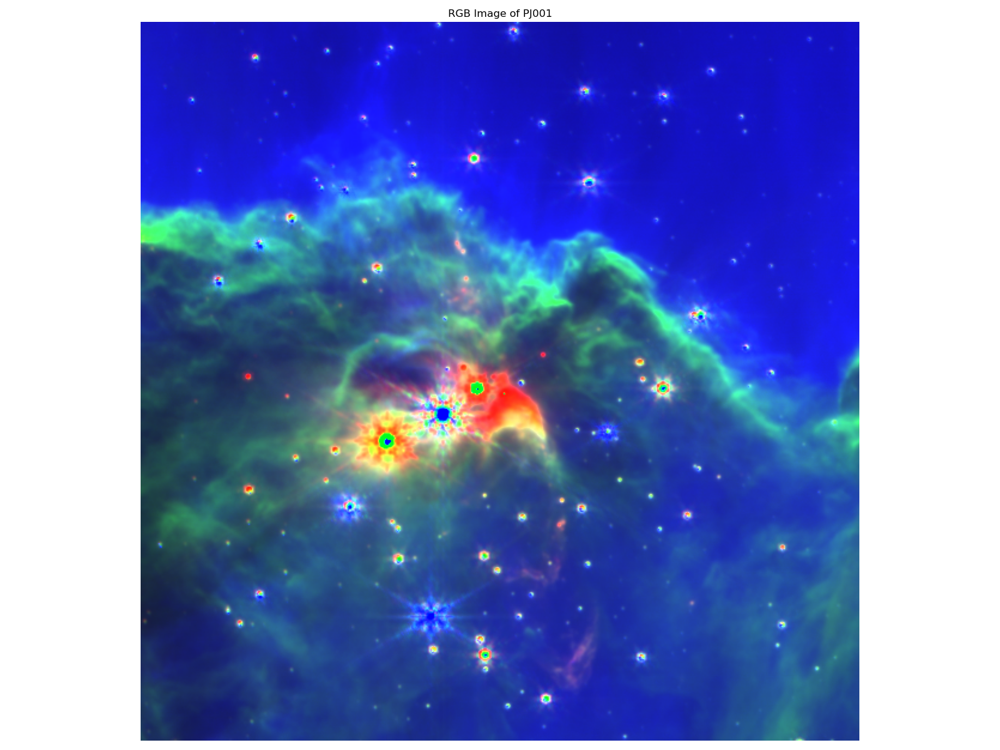

In [10]:
# Plotting rgb image
plt.figure(figsize=(16,12))
ax = plt.subplot(1, 1, 1)
im = ax.imshow(rgb, origin='lower')
ax.set_title(f'RGB Image of {focus}')
plt.axis('off')
plt.tight_layout()

Now let's do the same thing but for another outflow, this time looking at the prominent type 2 outflow **PJ006**

In [11]:
focus = 'PJ006'
coords = ol.get_coordinates(path_to_file, focus)
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y) # set them to integers for cropping

y_pm = 250 # Setup y plus-minus
x_pm = 250 # Seyup x plus-minus
region = ol.pixel_region(pixel_x, pixel_y, x_pm, y_pm) # Define region

cropped_imgs = ol.crop_images(reproj, region) # cropping

In [12]:
custom_stack = [0, 2, 3, 3, 4, 5] # setting up custom stacking order for make_rgb()
rgb = make_rgb(cropped_imgs, stretch=30, Q=0, minimum=[0, 5, 5], custom_stack=custom_stack) # make rgb image

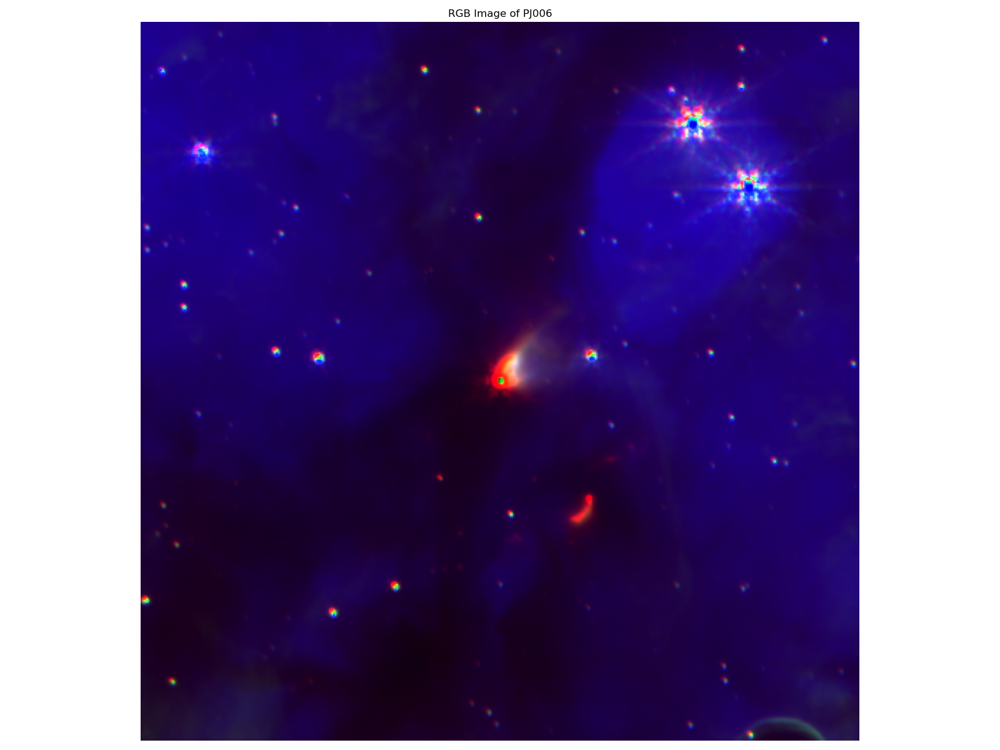

In [13]:
# Plotting rgb image
plt.figure(figsize=(16,12))
ax = plt.subplot(1, 1, 1)
im = ax.imshow(rgb, origin='lower')
ax.set_title(f'RGB Image of {focus}')
plt.axis('off')
plt.tight_layout()

Let's take another look at PJ006 but without the continuum. Using the `ContinuumSubtract` class from `continuum_sub.py`, we will produce the same image above but isolating the outflow itself.

In [14]:
c = ContinuumSubtract(files[5], files[4])
reproj_c = [cropped_imgs[4], cropped_imgs[5]]
scale_factor = 0.9756262810503796 # obtained in Continuum_subtract notebook
subc = c.continuum_sub(reproj_c, scale_factor)

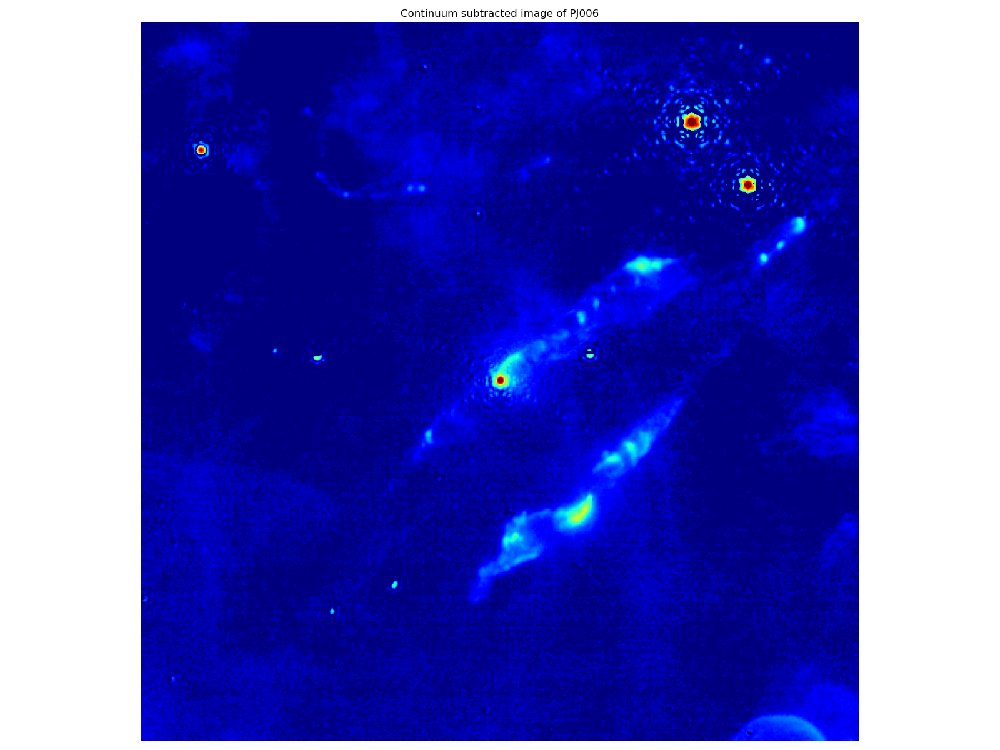

In [15]:
# Plot PJ006
fig = plt.figure(figsize=(16,12))
ax1 = plt.subplot(1, 1, 1)
im = ax1.imshow(subc, origin='lower', norm = simple_norm(subc, stretch='log', invalid=0, min_cut=0, max_cut=900), cmap='jet')
ax1.set_title(f'Continuum subtracted image of {focus}')
plt.axis('off')
plt.tight_layout()
plt.show()

In [16]:
import gc
gc.collect() # clean up memory

1127

Let's take a look at a comparison between some outflows imaged by NIRCam and the Hubble Space Telescope (HST). First we will reproject the HST image onto the target WCS as before.

In [49]:
hst_file = [glob.glob(img_dir+'HST/*f658n*')[0]]
print('File found:')
print(hst_file)

File found:
['/mnt/d/st_images/Carina_level3/HST/hst_skycell-p0212x09y08_acs_wfc_f658n_all_drc.fits']


In [56]:
hst_reproj = reproject(hst_file, target_wcs, tar_data, hdu_index=1) # Reproject HST images onto target wcs

Text(0.5, 1.0, 'HST Image of NGC3324 projected onto JWST region')

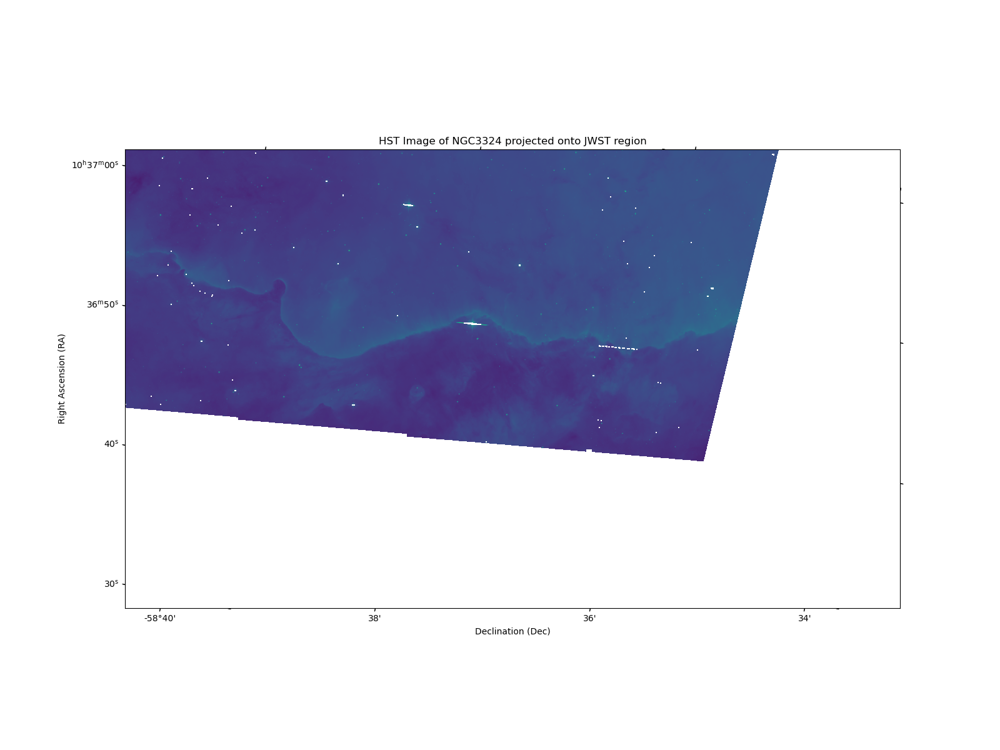

In [68]:
plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1, projection=target_wcs)
ax.imshow(hst_reproj[0], origin='lower', norm = simple_norm(hst_reproj[0], stretch='log', invalid=0, min_cut=0))
ax.coords['ra'].set_ticklabel_position('l')
ax.coords['dec'].set_ticklabel_position('b')
ax.set_ylabel('Right Ascension (RA)', fontsize=10)
ax.set_xlabel('Declination (Dec)', fontsize=10)
ax.set_title('HST Image of NGC3324 projected onto JWST region')

It can be clearly seen that the HST image of the NGC3324 does not contain the entire range that the JWST images have. But it will let us compare sources found with the NIRCam JWST images such as PJ001 and PJ006.

In [69]:
focus1 = 'PJ001'
focus2 = 'PJ006'
coords1 = ol.get_coordinates(path_to_file, focus1)
coords2 = ol.get_coordinates(path_to_file, focus2)

pixel_x1, pixel_y1 = target_wcs.world_to_pixel(coords1) # get pixel coordinates of the outflow
pixel_x1, pixel_y1 = int(pixel_x1), int(pixel_y1) # set them to integers for cropping
pixel_x2, pixel_y2 = target_wcs.world_to_pixel(coords2)
pixel_x2, pixel_y2 = int(pixel_x2), int(pixel_y2)

y1_pm, x1_pm = 300, 300
y2_pm, x2_pm = 200, 200

# Define regions
region1 = ol.pixel_region(pixel_x1, pixel_y1, x1_pm, y1_pm)
region2 = ol.pixel_region(pixel_x2, pixel_y2, x2_pm, y2_pm)

# Crop both JWST and HST images
cropped_imgs1 = ol.crop_images(reproj, region1)
cropped_imgs2 = ol.crop_images(reproj, region2)
cropped_hst1 = ol.crop_images(hst_reproj, region1)
cropped_hst2 = ol.crop_images(hst_reproj, region2)

c = ContinuumSubtract(files[5], files[4])
reproj_c1 = [cropped_imgs1[4], cropped_imgs1[5]]
reproj_c2 = [cropped_imgs2[4], cropped_imgs2[5]]

scale_factor = 0.9756262810503796 # obtained in Continuum_subtract notebook
subc1 = c.continuum_sub(reproj_c1, scale_factor)
subc2 = c.continuum_sub(reproj_c2, scale_factor)

Now we will plot the comparisons of JWST and HST images by comparing the continuum subtracted images to the HST.

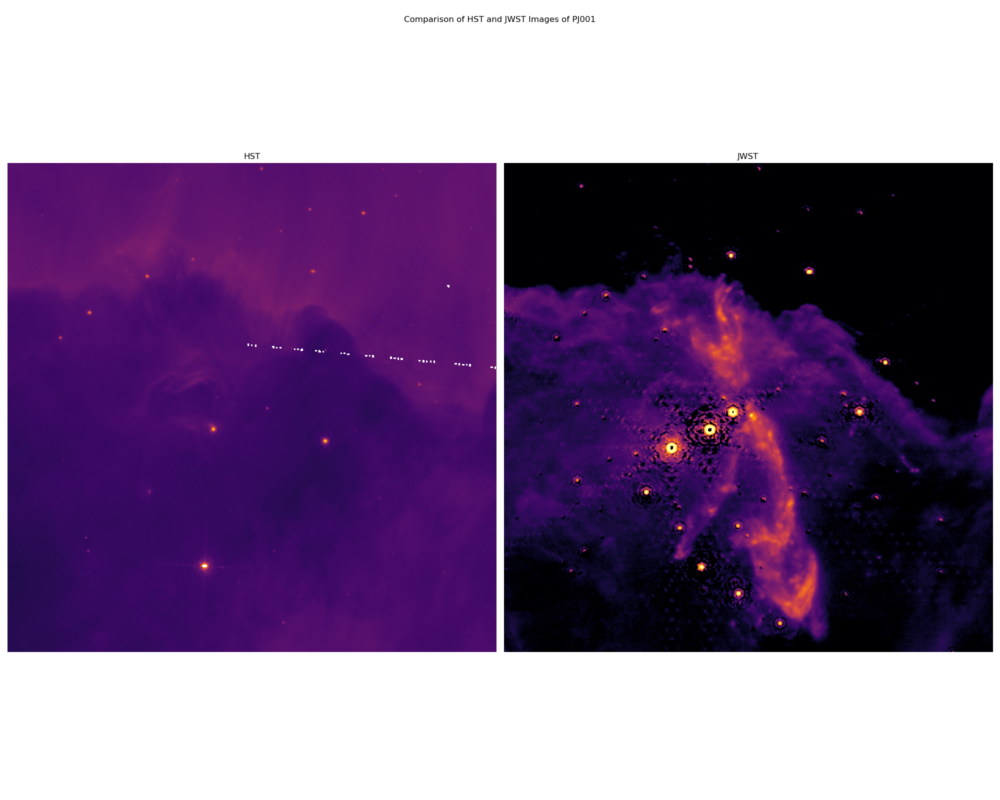

In [84]:
fig = plt.figure(figsize=(20,16))
ax1 = plt.subplot(1, 2, 1)
ax1.imshow(cropped_hst1[0], origin='lower', norm = simple_norm(hst_reproj[0], stretch='log', invalid=0, min_cut=0), cmap='inferno')
ax1.set_title('HST')
ax1.axis('off')

ax2 = plt.subplot(1, 2, 2)
ax2.imshow(subc1, origin='lower', norm = simple_norm(subc1, stretch='log', invalid=0, min_cut=0, max_cut=900), cmap='inferno')
ax2.set_title('JWST')
ax2.axis('off')

plt.suptitle(f'Comparison of HST and JWST Images of {focus1}')
plt.tight_layout()

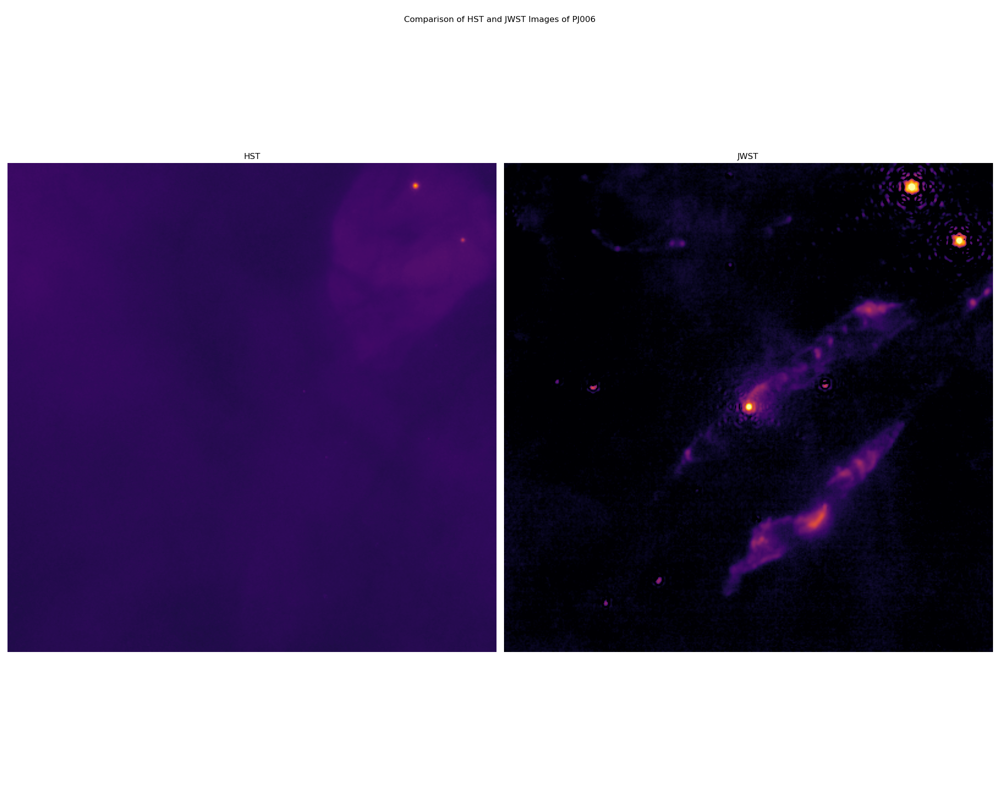

In [83]:
fig = plt.figure(figsize=(20,16))
ax1 = plt.subplot(1, 2, 1)
ax1.imshow(cropped_hst2[0], origin='lower', norm = simple_norm(hst_reproj[0], stretch='log', invalid=0, min_cut=0), cmap='inferno')
ax1.set_title('HST')
ax1.axis('off')

ax2 = plt.subplot(1, 2, 2)
ax2.imshow(subc2, origin='lower', norm = simple_norm(subc2, stretch='log', invalid=0, min_cut=0, max_cut=900), cmap='inferno')
ax2.set_title('JWST')
ax2.axis('off')

plt.suptitle(f'Comparison of HST and JWST Images of {focus2}')
plt.tight_layout()